In [3]:
import pandas as pd 
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from sklearn import tree 
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection  import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [2]:
df = pd.read_csv("winequality-red.csv")
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
df.quality.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df["citric acid"] = df["citric acid"].replace(0 , df['citric acid'].mean())

In [6]:
x = df.drop(columns='quality')
y = df["quality"]

In [7]:
x_train , x_test, y_train, y_test = train_test_split(x , y , test_size=0.20 , random_state=42)

In [8]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1279, 11)
(320, 11)
(1279,)
(320,)


In [9]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [10]:
y_pred = dt_model.predict(x_test)

In [11]:
dt_model.score(x_test, y_test)

0.559375

In [12]:
from sklearn.metrics import confusion_matrix , classification_report
print(classification_report(y_test , y_pred))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        10
           5       0.63      0.63      0.63       130
           6       0.56      0.56      0.56       132
           7       0.51      0.55      0.53        42
           8       0.00      0.00      0.00         5

    accuracy                           0.56       320
   macro avg       0.28      0.29      0.29       320
weighted avg       0.55      0.56      0.56       320



[Text(0.5735146973070399, 0.9722222222222222, 'X[10] <= 10.525\ngini = 0.642\nsamples = 1279\nvalue = [9, 43, 551, 506, 157, 13]'),
 Text(0.37746832591178964, 0.9166666666666666, 'X[6] <= 98.5\ngini = 0.541\nsamples = 786\nvalue = [6, 27, 465, 256, 30, 2]'),
 Text(0.23415632951653945, 0.8611111111111112, 'X[9] <= 0.575\ngini = 0.568\nsamples = 689\nvalue = [6, 26, 375, 251, 29, 2]'),
 Text(0.08110687022900763, 0.8055555555555556, 'X[10] <= 9.75\ngini = 0.496\nsamples = 263\nvalue = [4, 20, 176, 59, 4, 0]'),
 Text(0.03880407124681934, 0.75, 'X[8] <= 3.54\ngini = 0.389\nsamples = 165\nvalue = [2, 11, 126, 25, 1, 0]'),
 Text(0.03541136556403732, 0.6944444444444444, 'X[10] <= 9.075\ngini = 0.372\nsamples = 162\nvalue = [2, 11, 126, 22, 1, 0]'),
 Text(0.013570822731128074, 0.6388888888888888, 'X[0] <= 7.8\ngini = 0.711\nsamples = 11\nvalue = [1, 3, 3, 4, 0, 0]'),
 Text(0.006785411365564037, 0.5833333333333334, 'X[9] <= 0.515\ngini = 0.48\nsamples = 5\nvalue = [0, 3, 2, 0, 0, 0]'),
 Text(0.0

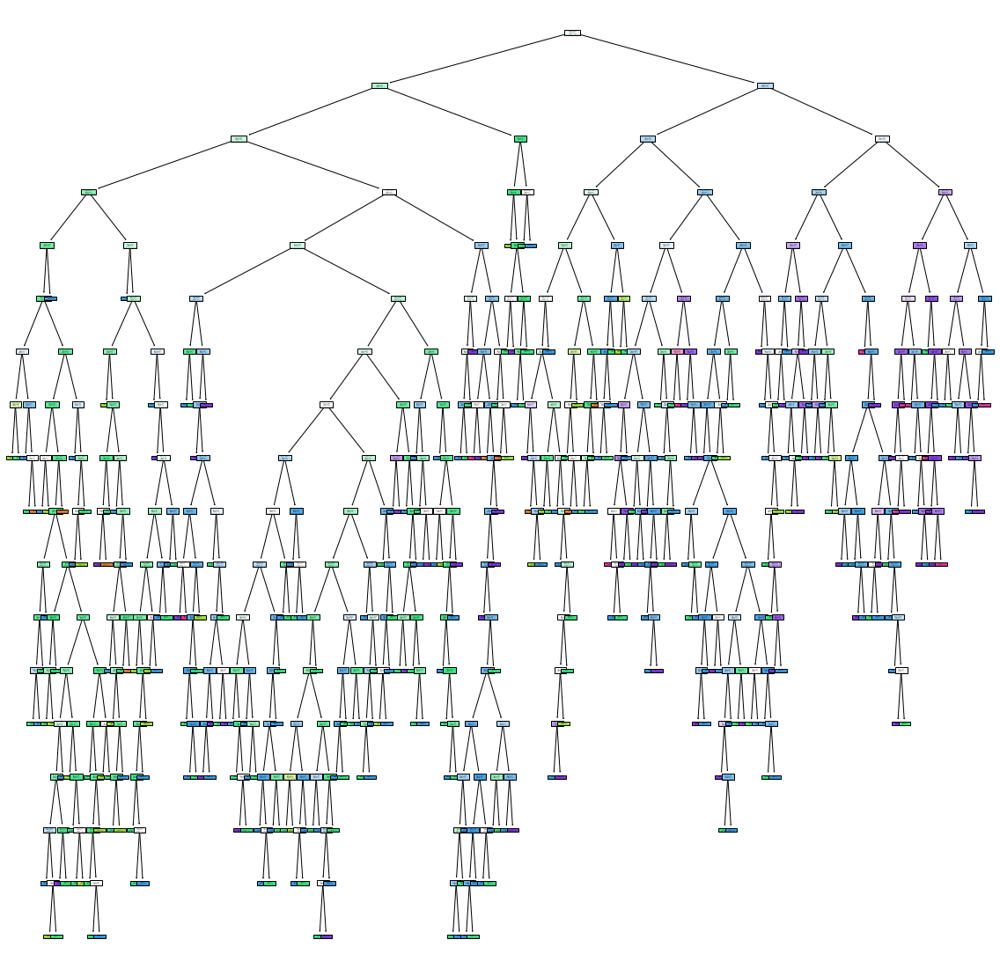

In [13]:
import sklearn
import  matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline 
sklearn.__version__

plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [14]:
x1 = df.drop(columns='quality')

In [15]:
y1 = df.quality

In [16]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

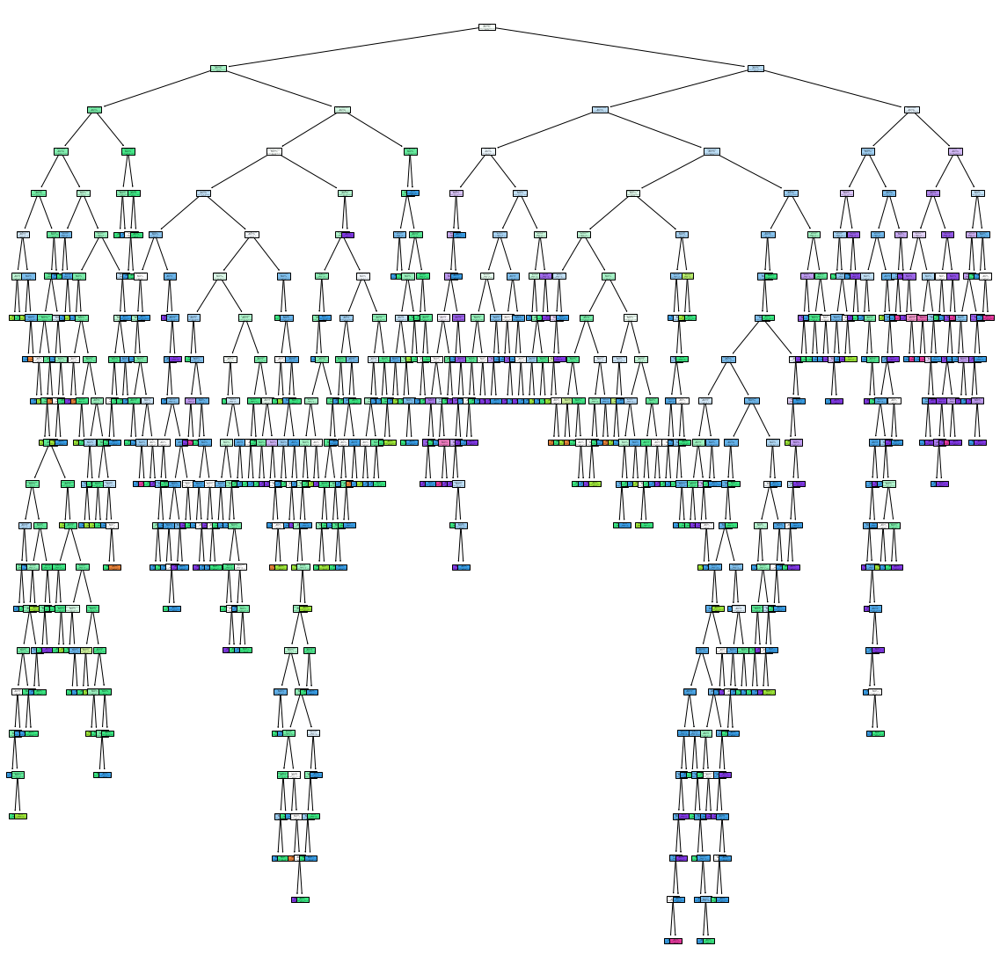

In [17]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)] ,feature_names=x1.columns)
plt.savefig('dt_model_1')

In [18]:
y_predict = dt_model.predict(x_test)
y_predict

array([5, 4, 5, 4, 6, 5, 5, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6, 6, 7, 5, 5, 6,
       6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5,
       5, 5, 6, 5, 5, 5, 5, 5, 6, 7, 5, 6, 6, 5, 6, 5, 6, 5, 6, 5, 7, 4,
       6, 5, 7, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 7, 5, 7, 5, 6, 7, 7, 5, 6,
       6, 5, 7, 5, 5, 5, 6, 5, 5, 6, 5, 5, 5, 5, 6, 7, 6, 7, 6, 5, 7, 6,
       6, 5, 7, 5, 5, 5, 6, 5, 5, 6, 6, 6, 6, 6, 6, 5, 7, 6, 5, 6, 6, 6,
       5, 6, 5, 4, 5, 6, 6, 7, 7, 6, 5, 4, 5, 5, 6, 6, 5, 5, 6, 6, 5, 5,
       6, 5, 5, 7, 5, 6, 8, 5, 7, 5, 6, 6, 6, 5, 3, 5, 5, 5, 7, 4, 7, 6,
       6, 5, 5, 5, 6, 6, 6, 6, 6, 7, 6, 6, 7, 4, 5, 7, 5, 6, 5, 5, 6, 6,
       5, 7, 5, 6, 5, 5, 7, 7, 5, 4, 6, 7, 8, 5, 5, 7, 7, 6, 6, 5, 6, 5,
       6, 6, 6, 5, 6, 5, 6, 7, 5, 6, 6, 5, 7, 6, 5, 7, 5, 7, 6, 5, 7, 5,
       6, 7, 5, 7, 5, 5, 8, 5, 6, 5, 5, 6, 6, 5, 5, 5, 6, 6, 5, 6, 5, 7,
       6, 6, 5, 5, 6, 6, 5, 6, 5, 6, 6, 6, 6, 7, 6, 6, 7, 5, 6, 6, 5, 7,
       5, 6, 5, 6, 7, 7, 8, 5, 5, 6, 5, 7, 6, 6, 5,

In [19]:
dt_model.score(x_test, y_test)

0.559375

In [20]:
dt_model.score(x_train, y_train)

1.0

In [21]:
confusion_matrix(y_test, y_predict)

array([[ 0,  0,  0,  1,  0,  0],
       [ 0,  0,  6,  4,  0,  0],
       [ 1,  6, 82, 38,  3,  0],
       [ 0,  2, 37, 74, 17,  2],
       [ 0,  0,  4, 13, 23,  2],
       [ 0,  0,  1,  2,  2,  0]], dtype=int64)

In [29]:
# path = dt_model1.cost_complexity_pruning_path(x1,y1)
# ccp_alpha = path.ccp_alphas
path = dt_model1.cost_complexity_pruning_path(x_train, y_train)
ccp_alpha = path.ccp_alphas

In [30]:
ccp_alpha

array([0.        , 0.00067017, 0.00069499, 0.00070367, 0.00070367,
       0.00071078, 0.00071078, 0.00071671, 0.00072172, 0.00072172,
       0.00072172, 0.00072172, 0.00072172, 0.00073299, 0.00073448,
       0.00073495, 0.00074277, 0.00074344, 0.00075343, 0.00075817,
       0.00076523, 0.00076711, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00078186, 0.00078186,
       0.00078186, 0.00078186, 0.00078186, 0.00097733, 0.00101642,
       0.00104248, 0.00104248, 0.00104248, 0.00104248, 0.00104248,
       0.00104248, 0.00104248, 0.00104248, 0.00104248, 0.00108592,
       0.00109461, 0.00112693, 0.00115858, 0.00117279, 0.00117279,
       0.00117279, 0.00117279, 0.00117279, 0.00117279, 0.00117279,
       0.00117279, 0.00117279, 0.00117847, 0.00118464, 0.00118582,
       0.00120286, 0.00120833, 0.00123723, 0.00123723, 0.00125

Text(0, 0.5, 'score')

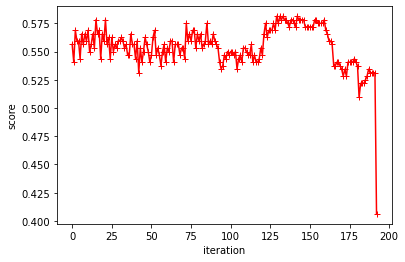

In [33]:
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x_train, y_train)
    dt_model2.append(dt_m)  ### giving the model  in the list
    score.append(dt_m.score(x_test, y_test))   ### giving the model in the 

    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [36]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0006701664246621245),
 DecisionTreeClassifier(ccp_alpha=0.0006949874033533142),
 DecisionTreeClassifier(ccp_alpha=0.0007036747458952308),
 DecisionTreeClassifier(ccp_alpha=0.0007036747458952308),
 DecisionTreeClassifier(ccp_alpha=0.0007107825716113442),
 DecisionTreeClassifier(ccp_alpha=0.0007107825716113442),
 DecisionTreeClassifier(ccp_alpha=0.0007167057597081053),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007217176880976721),
 DecisionTreeClassifier(ccp_alpha=0.0007329945269741986),
 DecisionTreeClassifier(ccp_alpha=0.0007344753239983887),
 DecisionTreeClassifier(ccp_alpha=0.0007349491790461296),
 DecisionTreeClassifier(ccp_alpha=0.0007427677873338543),
 DecisionTreeClassifier(ccp_alpha=0.000743440

In [40]:
train_score = [i.score(x_train,y_train) for i in dt_model2]
train_score
test_score = [i.score(x_test, y_test) for i in dt_model2]
test_score

[0.55625,
 0.540625,
 0.56875,
 0.559375,
 0.559375,
 0.54375,
 0.565625,
 0.55625,
 0.565625,
 0.559375,
 0.56875,
 0.55,
 0.55625,
 0.565625,
 0.553125,
 0.578125,
 0.565625,
 0.56875,
 0.54375,
 0.565625,
 0.559375,
 0.578125,
 0.55625,
 0.5625,
 0.54375,
 0.5625,
 0.55,
 0.55625,
 0.553125,
 0.559375,
 0.559375,
 0.5625,
 0.559375,
 0.553125,
 0.55625,
 0.546875,
 0.546875,
 0.565625,
 0.55625,
 0.55625,
 0.54375,
 0.559375,
 0.53125,
 0.553125,
 0.540625,
 0.55,
 0.5625,
 0.55625,
 0.55,
 0.540625,
 0.546875,
 0.5625,
 0.56875,
 0.546875,
 0.553125,
 0.546875,
 0.5375,
 0.55,
 0.55625,
 0.540625,
 0.553125,
 0.55,
 0.559375,
 0.559375,
 0.540625,
 0.55625,
 0.55625,
 0.55625,
 0.546875,
 0.553125,
 0.553125,
 0.54375,
 0.575,
 0.559375,
 0.565625,
 0.559375,
 0.56875,
 0.56875,
 0.553125,
 0.565625,
 0.559375,
 0.565625,
 0.553125,
 0.55625,
 0.559375,
 0.575,
 0.55625,
 0.559375,
 0.55625,
 0.565625,
 0.559375,
 0.55625,
 0.553125,
 0.540625,
 0.534375,
 0.5375,
 0.546875,
 0.543

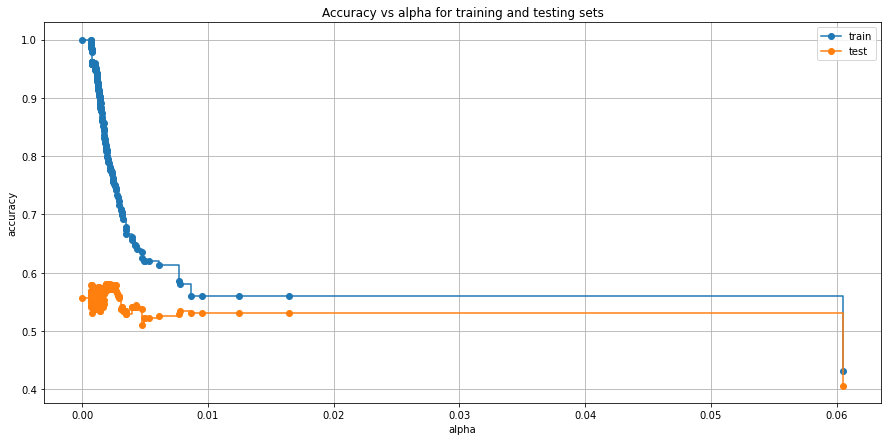

In [45]:
fig, ax = plt.subplots(figsize = (15 , 7))
plt.grid()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [55]:
dt_model_ccp = DecisionTreeClassifier(random_state=42 , ccp_alpha=.009)
dt_model_ccp.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.009, random_state=42)

plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [57]:
dt_model_ccp.score(x_train,y_train)

0.5590304925723222

In [58]:
dt_model_ccp.score(x_test,y_test)

0.53125

In [59]:
### Training and the Test Accuracy is almost Same : -

In [60]:
DecisionTreeClassifier()

DecisionTreeClassifier()

###  Find the Best Parameter 

In [66]:
grid_param = {"criterion" : ["gini"],
             "splitter" : ["best", "random"],
            "max_depth" : range(2,5,1),
             "min_samples_split":range(2,5 ,1),
             "min_samples_leaf":range(1,5,1),
             'ccp_alpha':np.random.rand(5)###
             }

In [72]:
gridCCP = GridSearchCV(estimator =DecisionTreeClassifier() , param_grid = grid_param, n_jobs=-1, verbose = 3)
gridCCP.fit(x_train, y_train)

Fitting 5 folds for each of 360 candidates, totalling 1800 fits


GridSearchCV(estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'ccp_alpha': array([0.57040551, 0.30667579, 0.74900549, 0.10512717, 0.43146469]),
                         'criterion': ['gini'], 'max_depth': range(2, 5),
                         'min_samples_leaf': range(1, 5),
                         'min_samples_split': range(2, 5),
                         'splitter': ['best', 'random']},
             verbose=3)

In [78]:
params = gridCCP.best_params_
params

{'ccp_alpha': 0.5704055060495801,
 'criterion': 'gini',
 'max_depth': 2,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [82]:
dt_CPP = DecisionTreeClassifier(ccp_alpha = 0.5704055060495801,
 criterion =  'gini',
 max_depth =  2,
 min_samples_leaf =  1,
 min_samples_split =  2,
 splitter =  'best')

In [83]:
dt_CPP.fit(x_train , y_train)   ##  FITTING THE MODEL 

DecisionTreeClassifier(ccp_alpha=0.5704055060495801, max_depth=2)

In [84]:
dt_CPP.score(x_train , y_train)

0.43080531665363564

In [85]:
dt_CPP.score(x_test , y_test)

0.40625

### BY USING THE ANOTHER PARAMETER 

In [87]:
dt_CPP1 = DecisionTreeClassifier(criterion='entropy' , max_depth=17 ,min_samples_leaf=1 , min_samples_split=3 , splitter='random',ccp_alpha=0.014)
dt_CPP1.fit(x_train , y_train)


DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_split=3, splitter='random')

In [88]:
dt_CPP1.score(x_train , y_train)

0.5754495699765442

In [89]:
dt_CPP1.score(x_test , y_test)

0.534375

###  Note : - HyperParameter Doesn't Improve your Accuracy   Sometimes

In [106]:
y_predict = dt_CPP1.predict(x_test)
y_predict ### This  one is the Predicted Data 

array([5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6, 5,
       6, 6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5,
       5, 6, 6, 6, 6, 6, 5, 5, 6, 6, 5, 5, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5,
       6, 5, 6, 5, 6, 5, 5, 6, 6, 5, 6, 6, 6, 6, 5, 6, 5, 5, 6, 6, 5, 6,
       6, 6, 6, 6, 6, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 5,
       6, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5, 6, 5, 5, 6, 6, 6, 6, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 6, 5, 5, 6, 6, 5, 5, 6, 6, 6, 5, 6, 6, 5, 6,
       5, 6, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6,
       5, 5, 5, 6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 5, 5,
       5, 6, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 6, 5, 5, 6, 6, 6, 5, 5, 6, 5,
       5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 6, 5, 6, 5, 5, 6, 5,
       6, 6, 5, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 6, 5, 5, 6, 6, 5, 6, 5, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 5, 5, 6,
       5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 6, 5,

In [105]:
np.array(y_test)  ### This  one  is the Test Data 

array([6, 5, 6, 5, 6, 5, 5, 5, 5, 6, 7, 3, 5, 5, 6, 7, 5, 7, 8, 5, 5, 6,
       5, 6, 6, 6, 7, 6, 5, 6, 5, 5, 6, 5, 6, 5, 7, 5, 4, 6, 5, 5, 7, 5,
       5, 6, 7, 6, 5, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 7, 5, 6, 6, 5,
       6, 5, 6, 5, 6, 4, 6, 6, 6, 5, 8, 5, 6, 6, 5, 6, 5, 6, 6, 7, 5, 6,
       7, 4, 7, 6, 5, 5, 5, 6, 5, 6, 5, 6, 5, 5, 5, 7, 6, 7, 6, 5, 6, 5,
       8, 5, 6, 5, 6, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 6, 7, 6, 5, 5, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 7, 6, 8, 5, 5, 5, 6, 6, 6, 5, 6, 7, 6, 5,
       6, 5, 5, 6, 6, 6, 7, 5, 7, 5, 5, 5, 6, 6, 5, 5, 6, 5, 7, 6, 7, 6,
       6, 5, 5, 6, 4, 6, 5, 7, 5, 5, 4, 5, 7, 6, 5, 6, 6, 7, 6, 5, 5, 6,
       5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 6, 7, 7, 5, 5, 6, 6, 7, 6, 5, 6, 6,
       6, 6, 6, 7, 4, 5, 5, 7, 5, 5, 5, 5, 6, 6, 5, 7, 5, 6, 6, 6, 5, 4,
       6, 7, 6, 7, 5, 6, 6, 5, 5, 6, 5, 6, 4, 5, 6, 6, 5, 6, 6, 5, 5, 6,
       7, 7, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 7,
       5, 6, 4, 6, 6, 8, 6, 5, 5, 6, 5, 7, 6, 6, 5,

In [107]:
confusion_matrix(y_predict , y_test)

array([[ 0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0],
       [ 0,  5, 92, 53,  2,  0],
       [ 1,  5, 38, 79, 40,  5],
       [ 0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0]], dtype=int64)

In [109]:
set(y_test)

{3, 4, 5, 6, 7, 8}